In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from transformers import BertTokenizer, BertModel
import torch
import seaborn as sns


In [53]:
data = pd.read_excel("grouped_situations.xlsx")
data.fillna("", inplace=True)
data = data.sort_values(by='Cluster', ascending=True)
data.head()

,Post ID,Sound Bite Text,Situation,Situation Descriptor,Need,Need Descriptor,Cluster
49,BRDRDT2-t1_jo1ldas,"Diet pepsi for that sweet craving. NA beers, I...","craving sweet drink, alcohol alternatives, hid...","diet pepsi for that sweet craving. na beers, i...",craving relief,diet pepsi for that sweet craving.,0
32,https://ridemonkey.bikemag.com/threads/41-year...,maxyedor said: I could give two shits about ge...,preference for non-intoxicating beer on hot da...,"maxyedor on trying na beer, enjoying heineken ...",enjoy non-alcoholic beer option,na beer can thread that needle,0
77,BRDRDT2-t1_j8nevx7,I saw a full cooler section full of NA beers a...,expanded beer selection at savory grape,i saw a full cooler section full of na beers a...,non-alcoholic options,i saw a full cooler section full of na beers,0
34,BRDRDT2-t1_i2yc5ox,"I'm not a massive fan of plain water, soft dri...",person prefers beer over other drinks due to t...,situation: preferring beer over other drinks d...,desire for tasty low/no alcohol beer at reason...,low and no alcohol beer actually tasted like b...,0
76,BRDRDT2-t1_jtjdr2r,There is still some alcohol in just about ever...,consuming low alcohol content in non-alcoholic...,there is still some alcohol in just about ever...,low alcohol tolerance,many opt for non alcoholic beer but complain a...,0


In [58]:
# Load pre-trained BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained('BAAI/bge-base-en-v1.5')
model = BertModel.from_pretrained('BAAI/bge-base-en-v1.5')

# # Define situations and needs
needs = data["Need"].values
situations = data["Situation"].values
posts = data["Sound Bite Text"].values
clusters = data["Cluster"].values
# Function to generate BERT embeddings
def generate_bert_embeddings(text):
    # Tokenize input text
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True)
    # Forward pass through BERT model
    with torch.no_grad():
        outputs = model(**inputs)
    # Extract embeddings from BERT model output
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().numpy()
    return embeddings

# Map situations and needs to BERT embeddings
text_embeddings = [generate_bert_embeddings(post) for post in posts]
situation_embeddings = [generate_bert_embeddings(situation) for situation in situations]
need_embeddings = [generate_bert_embeddings(need) for need in needs]
cosine_sim_matrix_situation_vs_situation = cosine_similarity(situation_embeddings, situation_embeddings)
cosine_sim_matrix_situation_vs_posts = cosine_similarity(situation_embeddings, text_embeddings)
cosine_sim_matrix_situation_needs_vs_posts = cosine_similarity(np.mean([situation_embeddings, need_embeddings], axis=0), text_embeddings)
cosine_sim_matrix_situation_need_vs_situation_need = cosine_similarity(np.mean([situation_embeddings, need_embeddings], axis=0), np.mean([situation_embeddings, need_embeddings], axis=0))

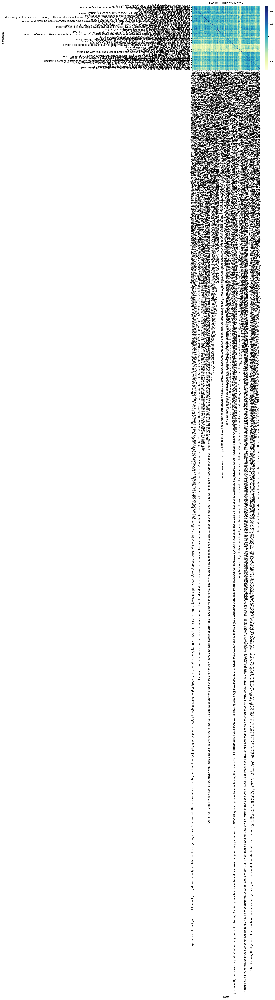

In [55]:
# Create a dictionary with the heatmap data
heatmap_data = {
    'posts': posts.tolist(),
    'situation': [f'( Situation: {s} ) || ( Cluster: {c} )' for s, c in zip(situations, clusters)],
    'cosine_sim_matrix': (cosine_sim_matrix_situation_vs_posts * 100).astype(int).tolist()
}

# Convert the dictionary to JSON
# heatmap_json = json.dumps(heatmap_data)

# Print the JSON data
# Specify the file path
file_path = "./how-to-bind-data-to-the-vue-heatmap-chart-component/src/assets/situation_vs_posts_heatmap.json"

# Save the JSON data to the file
with open(file_path, "w") as file:
    json.dump(heatmap_data, file)
    
# Create heatmap
sns.heatmap(cosine_sim_matrix_situation_vs_posts, cmap="YlGnBu")

# Add labels and title
plt.xlabel("Posts")
plt.ylabel("Situations")
plt.title("Cosine Similarity Matrix")

# Add situation and needs labels
plt.xticks(np.arange(len(posts)), posts, rotation=90)
plt.yticks(np.arange(len(situations)), situations)

# Show the plot
plt.show()

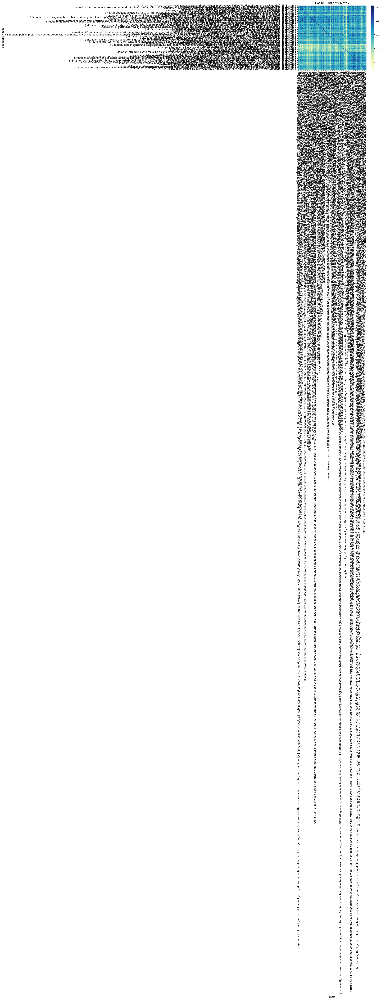

In [56]:
import json

# Calculate cosine similarity matrix
 
# Create heatmap
sns.heatmap(cosine_sim_matrix_situation_needs_vs_posts, cmap="YlGnBu")

# Add labels and title
plt.xlabel("Posts")
plt.ylabel("Situation+Needs")
plt.title("Cosine Similarity Matrix")

# Add situation and needs labels
plt.xticks(np.arange(len(posts)), posts, rotation=90)
plt.yticks(np.arange(len(situations)),  [ f'( Situation: {s} ) || ( Need: {n} ) || Cluster: {c}' for s, n, c in zip(situations, needs, clusters)])

# Show the plot
plt.show()


# Concatenate situations and needs
# situation_needs = [f'( Situation: {s} ) || ( Need: {n} || ( Cluster: {c} )' for s, n, c in zip(situations, needs, clusters)]
# BEGIN: CELL

# cosine_sim_matrix = (cosine_sim_matrix * 100).astype(int)

# Print the updated cosine_sim_matrix
# print(cosine_sim_matrix_situation_needs_vs_posts)
# END: CELL

# Create a dictionary with the heatmap data
heatmap_data = {
    'posts': posts.tolist(),
    'situation_needs': [ f'( Situation: {s} ) || ( Need: {n} ) || Cluster: {c}' for s, n, c in zip(situations, needs, clusters)],
    'cosine_sim_matrix': (cosine_sim_matrix_situation_needs_vs_posts * 100).astype(int).tolist()
}

# Convert the dictionary to JSON
# heatmap_json = json.dumps(heatmap_data)

# Print the JSON data
# Specify the file path
file_path = "./how-to-bind-data-to-the-vue-heatmap-chart-component/src/assets/situation_needs_vs_posts.json"

# Save the JSON data to the file
with open(file_path, "w") as file:
    json.dump(heatmap_data, file)



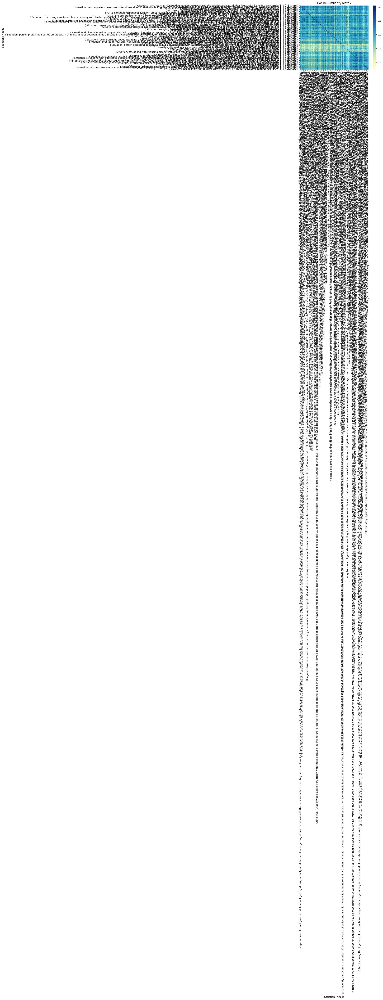

In [57]:
import json

# Calculate cosine similarity matrix
 
# Create heatmap
sns.heatmap(cosine_sim_matrix_situation_needs_vs_posts, cmap="YlGnBu")

# Add labels and title
plt.xlabel("Situation+Needs")
plt.ylabel("Situation+Needs")
plt.title("Cosine Similarity Matrix")

# Add situation and needs labels
plt.xticks(np.arange(len(posts)), posts, rotation=90)
plt.yticks(np.arange(len(situations)),  [ f'( Situation: {s} ) || ( Need: {n} )  || ( Cluster{c} )' for s, n, c in zip(situations, needs, clusters)])

# Show the plot
plt.show()


# Concatenate situations and needs
# situation_needs = [f'( Situation: {s} ) || ( Need: {n} )  || ( Cluster{c} )' for s, n , c in zip(situations, needs, clusters)]
# BEGIN: CELL

# cosine_sim_matrix = (cosine_sim_matrix * 100).astype(int)

# Print the updated cosine_sim_matrix
# print(cosine_sim_matrix_situation_needs_vs_posts)
# END: CELL

# Create a dictionary with the heatmap data
heatmap_data = {
    'situation_needs':  [f'( Situation: {s} ) || ( Need: {n} )  || ( Cluster{c} )' for s, n , c in zip(situations, needs, clusters)],
    'cosine_sim_matrix': (cosine_sim_matrix_situation_need_vs_situation_need * 100).astype(int).tolist()
}

# Convert the dictionary to JSON
# heatmap_json = json.dumps(heatmap_data)

# Print the JSON data
# Specify the file path
file_path = "./how-to-bind-data-to-the-vue-heatmap-chart-component/src/assets/cosine_sim_matrix_situation_need_vs_situation_need.json"

# Save the JSON data to the file
with open(file_path, "w") as file:
    json.dump(heatmap_data, file)

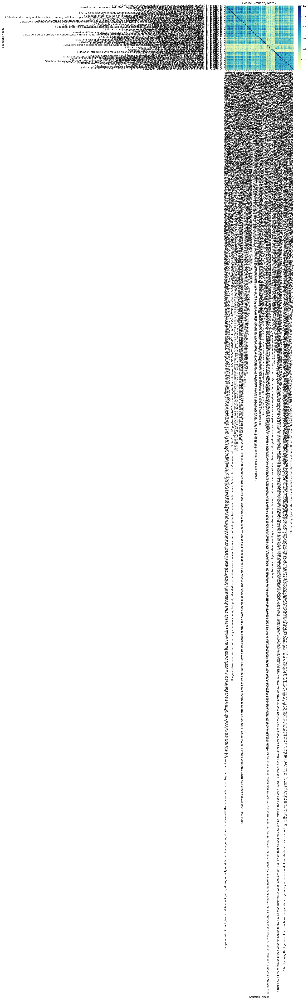

In [60]:
import json

# Calculate cosine similarity matrix
 
# Create heatmap
sns.heatmap(cosine_sim_matrix_situation_vs_situation, cmap="YlGnBu")

# Add labels and title
plt.xlabel("Situation+Needs")
plt.ylabel("Situation+Needs")
plt.title("Cosine Similarity Matrix")

# Add situation and needs labels
plt.xticks(np.arange(len(posts)), posts, rotation=90)
plt.yticks(np.arange(len(situations)),  [ f'( Situation: {s} ) || ( Cluster: {c} )' for s,  c in zip(situations, clusters)])

# Show the plot
plt.show()


# Concatenate situations and needs
# situation_needs = [f'( Situation: {s} ) || ( Need: {n} )  || ( Cluster{c} )' for s, n , c in zip(situations, needs, clusters)]
# BEGIN: CELL

# cosine_sim_matrix = (cosine_sim_matrix * 100).astype(int)

# Print the updated cosine_sim_matrix
# print(cosine_sim_matrix_situation_needs_vs_posts)
# END: CELL

# Create a dictionary with the heatmap data
heatmap_data = {
    'situation':  [f'( Situation: {s} ) || ( Cluster{c} )' for s, c in zip(situations, clusters)],
    'cosine_sim_matrix': (cosine_sim_matrix_situation_vs_situation * 100).astype(int).tolist()
}

# Convert the dictionary to JSON
# heatmap_json = json.dumps(heatmap_data)

# Print the JSON data
# Specify the file path
file_path = "./how-to-bind-data-to-the-vue-heatmap-chart-component/src/assets/cosine_sim_matrix_situation_vs_situation.json"

# Save the JSON data to the file
with open(file_path, "w") as file:
    json.dump(heatmap_data, file)